**Gamma correction** is a non-linear adjustment to individual pixel values. While in image normalization we carried out linear operations on individual pixels, such as scalar multiplication and addition/subtraction, gamma correction carries out a non-linear operation on the source image pixels, and can cause saturation of the image being altered.

Gamma values < 1 will shift the image towards the darker end of the spectrum while gamma values > 1 will make the image appear lighter. A gamma value of G=1 will have no affect on the input image:

In [ ]:
# import the necessary packages
from __future__ import print_function
import numpy as np
import argparse
import cv2
from google.colab.patches import cv2_imshow

def adjust_gamma(image, gamma=1.0):
	# build a lookup table mapping the pixel values [0, 255] to
	# their adjusted gamma values
	invGamma = 1.0 / gamma
	table = np.array([((i / 255.0) ** invGamma) * 255
		for i in np.arange(0, 256)]).astype("uint8")
	# apply gamma correction using the lookup table
	return cv2.LUT(image, table)

In [ ]:
original = cv2.imread('/content/MicrosoftTeams-image (5).png')

In [ ]:
# loop over various values of gamma
for gamma in np.arange(0.5, 2.5, 0.5):
	# ignore when gamma is 1 (there will be no change to the image)
	if gamma == 1:
		continue
	# apply gamma correction and show the images
	gamma = gamma if gamma > 0 else 0.5
	adjusted = adjust_gamma(original, gamma=gamma)
	cv2.putText(adjusted, "g={}".format(gamma), (20, 70), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 5)
	cv2_imshow(np.hstack([original, adjusted]))

# A generative adversarial network (GAN) is a powerful approach to machine learning (ML). At a high level, a GAN is simply two neural networks that feed into each other. One produces increasingly accurate data while the other gradually improves its ability to classify such data.

GFPGAN - Image Restoration with Generative Facial Prior is a blind face restoration algorithm towards real-world face images.

It leverages the generative face prior in a pre-trained GAN (e.g., StyleGAN2) to restore realistic faces while precerving fidelity.

In [ ]:
# Clone GFPGAN and enter the GFPGAN folder
%cd /content
!rm -rf GFPGAN
!git clone https://github.com/TencentARC/GFPGAN.git
%cd GFPGAN

# Set up the environment
# Install basicsr - https://github.com/xinntao/BasicSR
# We use BasicSR for both training and inference
!pip install basicsr
# Install facexlib - https://github.com/xinntao/facexlib
# We use face detection and face restoration helper in the facexlib package
!pip install facexlib
# Install other depencencies
!pip install -r requirements.txt
!python setup.py develop
!pip install realesrgan  # used for enhancing the background (non-face) regions
# Download the pre-trained model
!wget https://github.com/TencentARC/GFPGAN/releases/download/v0.2.0/GFPGANCleanv1-NoCE-C2.pth -P experiments/pretrained_models

In [ ]:
%cd ..

/content/GFPGAN


In [ ]:
# upload your own images
import os
from google.colab import files
import shutil

upload_folder = 'inputs/upload'

if os.path.isdir(upload_folder):
    shutil.rmtree(upload_folder)
os.mkdir(upload_folder)

# upload images
uploaded = files.upload()
for filename in uploaded.keys():
  dst_path = os.path.join(upload_folder, filename)
  print(f'move {filename} to {dst_path}')
  shutil.move(filename, dst_path)

Saving WhatsApp Image 2022-04-08 at 8.35.28 AM.jpeg to WhatsApp Image 2022-04-08 at 8.35.28 AM.jpeg
move WhatsApp Image 2022-04-08 at 8.35.28 AM.jpeg to inputs/upload/WhatsApp Image 2022-04-08 at 8.35.28 AM.jpeg


In [ ]:
# Now we use the GFPGAN to restore the above low-quality images
# We use [Real-ESRGAN](https://github.com/xinntao/Real-ESRGAN) for enhancing the background (non-face) regions
!rm -rf results
!python inference_gfpgan.py --upscale 2 --test_path inputs/upload --save_root results --model_path experiments/pretrained_models/GFPGANCleanv1-NoCE-C2.pth --bg_upsampler realesrgan

!ls results/cmp

Downloading: "https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.1/RealESRGAN_x2plus.pth" to /usr/local/lib/python3.7/dist-packages/realesrgan/weights/RealESRGAN_x2plus.pth

100% 64.0M/64.0M [00:00<00:00, 96.9MB/s]
Traceback (most recent call last):
  File "inference_gfpgan.py", line 155, in <module>
    main()
  File "inference_gfpgan.py", line 101, in main
    raise ValueError(f'Model {model_name} does not exist.')
ValueError: Model GFPGANv1.3 does not exist.
ls: cannot access 'results/cmp': No such file or directory


In [ ]:
!python inference_gfpgan.py --upscale 2 --test_path inputs/upload --save_root results --model_path experiments/pretrained_models/GFPGANCleanv1-NoCE-C2.pth --bg_upsampler realesrgan


In [ ]:
# We first visualize the cropped faces
# The left are the inputs images; the right are the results of GFPGAN

import cv2
import matplotlib.pyplot as plt
def display(img1, img2):
  fig = plt.figure(figsize=(25, 10))
  ax1 = fig.add_subplot(1, 2, 1) 
  plt.title('Input image', fontsize=16)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, 2, 2)
  plt.title('GFPGAN output', fontsize=16)
  ax2.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2)
def imread(img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

# display each image in the upload folder
import os
import glob

input_folder = 'inputs/upload'
result_folder = 'results/restored_imgs'
input_list = sorted(glob.glob(os.path.join(input_folder, '*')))
output_list = sorted(glob.glob(os.path.join(result_folder, '*')))
for input_path, output_path in zip(input_list, output_list):
  img_input = imread(input_path)
  img_output = imread(output_path)
  display(img_input, img_output)

In [ ]:
# download the result
!ls results
print('Download results')
os.system('zip -r download.zip results')
files.download("download.zip")

Image Super Resolution - ISR (Image Super-Resolution) is a library to upscale and improve the quality of low resolution images. It uses GAN weights in the backend and upscales and improve the quality of low resolution images.
* Super Resolution GAN
* Enhances Super Resolution GAN

networks include:
* The super-scaling Residual Dense Network
* ESRGAN: Enhanced Super-Resolution Generative Adversarial Networks 

In [ ]:
# !pip install ISR
# !pip install 'h5py==2.10.0' --force-reinstall
from ISR.models import RDN, RRDN

# RDN: psnr-large, psnr-small, noise-cancel - RRDN: gans
# RRDN model, trained with Adversarial and VGG features losses, choose the option weights='gans' when creating a RRDN model.

# model = RDN(weights='noise-cancel')
model = RRDN(weights='gans')
# model = RDN(weights='psnr-small')
# model = RDN(weights='psnr-large')

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from ISR.models import RRDN
def predict(img):
        # Load image and prepare it
        img = Image.open(img)
        lr_img = np.array(img)
        # Load a pre-trained model and run prediction
        model = RRDN(weights='gans')
        sr_img = model.predict(lr_img)
        return (Image.fromarray(sr_img))

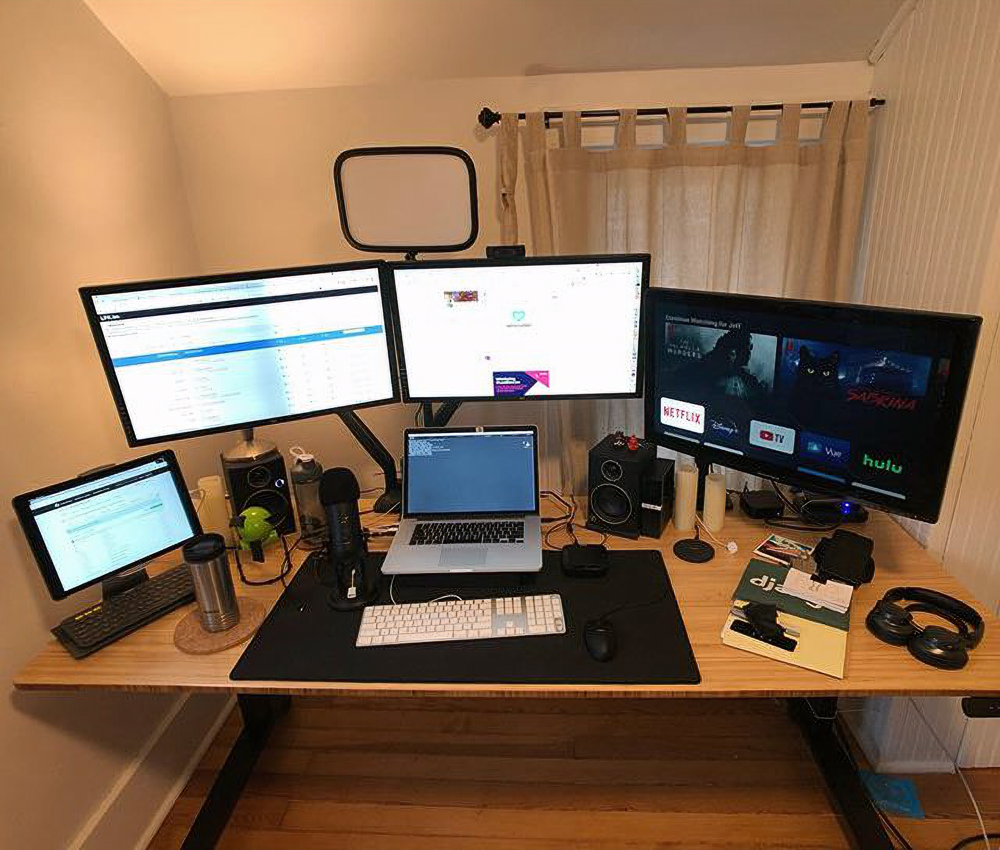

In [ ]:
predict('/content/Real-ESRGAN/inputs/1610.jpg')

Real-ESRGAN aims at developing Practical Algorithms for General Image Restoration.
Extension of the powerful ESRGAN to a practical restoration application (namely, Real-ESRGAN), which is trained with pure synthetic data.



In [ ]:
# Clone Real-ESRGAN and enter the Real-ESRGAN
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN
# Set up the environment
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop
# Download the pre-trained model
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth -P experiments/pretrained_models

Cloning into 'Real-ESRGAN'...
remote: Enumerating objects: 638, done.
remote: Total 638 (delta 0), reused 0 (delta 0), pack-reused 638
Receiving objects: 100% (638/638), 5.00 MiB | 32.61 MiB/s, done.
Resolving deltas: 100% (335/335), done.
/content/GFPGAN/Real-ESRGAN
running develop
running egg_info
creating realesrgan.egg-info
writing realesrgan.egg-info/PKG-INFO
writing dependency_links to realesrgan.egg-info/dependency_links.txt
writing requirements to realesrgan.egg-info/requires.txt
writing top-level names to realesrgan.egg-info/top_level.txt
writing manifest file 'realesrgan.egg-info/SOURCES.txt'
reading manifest template 'MANIFEST.in'
adding license file 'LICENSE'
writing manifest file 'realesrgan.egg-info/SOURCES.txt'
running build_ext
Creating /usr/local/lib/python3.7/dist-packages/realesrgan.egg-link (link to .)
Adding realesrgan 0.2.5.0 to easy-install.pth file

Installed /content/GFPGAN/Real-ESRGAN
Processing dependencies for realesrgan==0.2.5.0
Searching for tqdm==4.64.0
B

In [ ]:
%cd ..
%cd Real-ESRGAN

/content/GFPGAN
/content/GFPGAN/Real-ESRGAN


In [ ]:
import os
from google.colab import files
import shutil

upload_folder = 'inputs'
result_folder = 'results'

if os.path.isdir(upload_folder):
    shutil.rmtree(upload_folder)
if os.path.isdir(result_folder):
    shutil.rmtree(result_folder)
os.mkdir(upload_folder)
os.mkdir(result_folder)

# upload images
uploaded = files.upload()
for filename in uploaded.keys():
  dst_path = os.path.join(upload_folder, filename)
  print(f'move {filename} to {dst_path}')
  shutil.move(filename, dst_path)

Saving WhatsApp Image 2022-04-08 at 8.35.28 AM_out.jpeg to WhatsApp Image 2022-04-08 at 8.35.28 AM_out.jpeg
move WhatsApp Image 2022-04-08 at 8.35.28 AM_out.jpeg to inputs/WhatsApp Image 2022-04-08 at 8.35.28 AM_out.jpeg


In [ ]:
# if it is out of memory, try to use the `--tile` option
# We upsample the image with the scale factor X3.5
!python inference_realesrgan.py -n RealESRGAN_x4plus -i inputs --outscale 3.5 --half --face_enhance
# Arguments
# -n, --model_name: Model names
# -i, --input: input folder or image
# --outscale: Output scale, can be arbitrary scale factor

Testing 0 WhatsApp Image 2022-04-08 at 8.35.28 AM_out
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "
Error CUDA out of memory. Tried to allocate 37.88 GiB (GPU 0; 11.17 GiB total capacity; 10.42 GiB already allocated; 74.81 MiB free; 10.58 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
If you encounter CUDA out of memory, try to set --tile with a smaller number.


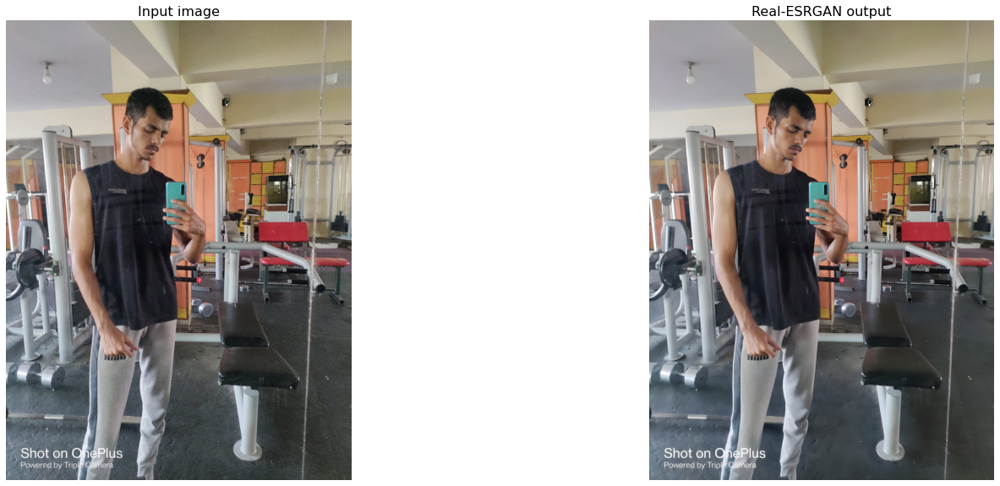

In [ ]:
# utils for visualization
import cv2
import matplotlib.pyplot as plt
def display(img1, img2):
  fig = plt.figure(figsize=(25, 10))
  ax1 = fig.add_subplot(1, 2, 1) 
  plt.title('Input image', fontsize=16)
  ax1.axis('off')
  ax2 = fig.add_subplot(1, 2, 2)
  plt.title('Real-ESRGAN output', fontsize=16)
  ax2.axis('off')
  ax1.imshow(img1)
  ax2.imshow(img2)
def imread(img_path):
  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img

# display each image in the upload folder
import os
import glob

input_folder = 'inputs'
result_folder = 'results'
input_list = sorted(glob.glob(os.path.join(input_folder, '*')))
output_list = sorted(glob.glob(os.path.join(result_folder, '*')))
for input_path, output_path in zip(input_list, output_list):
  img_input = imread(input_path)
  img_output = imread(output_path)
  display(img_input, img_output)

In [ ]:
# Download the results
zip_filename = 'Real-ESRGAN_result.zip'
if os.path.exists(zip_filename):
  os.remove(zip_filename)
os.system(f"zip -r -j {zip_filename} results/*")
files.download(zip_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>